# <center>Life Expectancy</center> 


## ABSTRACT
This project seeks to better understand the various factors that affect life expectancy and their relationship with each other and life expectancy itself.  The project will also use various machine learning techniques to predict various life expectancies by country and other indicators and provide the metrics needed to evaluate the predictions.

Keywords: python, seaborn, numpy, plotly, pandas, matplotlib, scikit-learning, multiple linear regression, polynomial regression, decision tree, random forest, regression, logistic regression, machine learning

## THIS PROJECT
Life expectancy is also regarded as the key metric for assessing population’s health and the Global Health Observatory indicates that life expectancy globally increased from 66.8 years in 2000 to 73.4 in 2019.   Life expectancy is measured by the number of years a person is expected to live.  Improving life expectancy for individuals at birth depends on identifying and improving factors that negatively affect life expectancy while stressing factors that improve life expectancy.

There are many factors that can affect a person’s life expectancy including a person’s sex, health factors, and other demographic data.

This project seeks to better understand the various factors that affect life expectancy and their relationship with each other and life expectancy itself.  The project will also use various machine learning techniques to predict various life expectancy by country and other indicators and provide the metrics needed to evaluate the predictions.

## ABOUT THE DATA
The dataset being used in this project is comprised of data from all over the world from various countries aggregated by the World Health Organization (WHO). 

The data contains 2938 rows and 22 columns and was collected from 193 countries over a period of 15 years from 2000 to 2015.   

## APPROACH
This project will use Python and a variety of its libraries to explore and analyze the Life Expectancy dataset from the WHO. 

*	Data Cleaning & Exploration: Python, Pandas, NumPy, SciPy
*	Visualization: Seaborn, Matplotlib, Dataframe, Plotly, and Tableau
*	Modeling: Sklearn (Mean Squared Error, r2 Score, Confusion Matrix, Accuracy Score, Classification Report, Roc Curve)
*	Deployment: Results will be published to the resources below:
    -	Code & Documents - https://github.com/schirko/Life_Expectancy-WHO_Data
    -	Blog - https://sschirko.edublogs.org/ 
    
    
## THE DATASET 
This dataset was obtained from Kaggle challenges via the World Health Organization.  It is comprised of data from around the world and includes many indicators for each country during the time frame of 2000-2015.  The data essentially represents a times series for the countries and features included. 
In general, I will be using life expectancy as the dependent variable and the other features as independent variables.

The dataset'sfeatures.

    <center>![about-the-dataset.png](attachment:about-the-dataset.png)</center>
    

## GETTING STARTED!!
Alrighty then, let’s get started digging into the data.  For this project I’m using PyCharm as my IDE along with various Python libraries.



## Importing Python libraries

In [1]:
# Imports and dataset load
import os
import csv
import pandas as pd
import dataframe_image as dfi
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.api as sm
from matplotlib import pyplot
from IPython.display import display, HTML
from scipy.stats import stats
from scipy.stats.mstats import winsorize
import numpy as np
from sklearn import metrics
from sklearn.metrics import mean_squared_error, r2_score, confusion_matrix, accuracy_score, \
    classification_report, roc_auc_score, roc_curve
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.ensemble import RandomForestRegressor
from sklearn.preprocessing import PolynomialFeatures
from sklearn.tree import DecisionTreeRegressor
from sklearn.linear_model import LinearRegression, LogisticRegression
import plotly.graph_objects as go

## Loading the dataset

In [2]:
# GLOBAL VARIABLES
# Load data into pandas data frame
pd.set_option('display.width', 480)
pd.set_option("display.max_columns", 20)
df = pd.read_csv('Life_Expectancy_WHO_Data.csv')
wins_df = pd.DataFrame()  # Winsorized dataframe holder

wins_dict = {}  # Winsorized feature dictionary
feature_vars = list(df.columns)[3:]  # List of numerical features

# Check for directory called charts, create it if it doesn't exist
directory = "charts"

if not os.path.exists(directory):
    os.makedirs(directory)
    print(f"Directory '{directory}' created.")
else:
    print(f"Directory '{directory}' already exists.")

Directory 'charts' already exists.


## DATA CLEANING
My primary goal in this project is to understand the factors that affect the life expectancy.  So, the target variable will usually be life expectancy.  Before I can explore the data, it must first be cleaned by detecting and removing null-values and treating outliers.  Then I can move on to data exploration and analysis and begin to understand the data’s features.

A few things I will need to know about the dataset and it’s features in order to get it properly cleaned up.  Each of these questions will be answered in the course of this project.
    •	What are the outliers for features?
    •	Are there missing values?
    •	What is the meaning of the variable?


I used shape() to determine that the dataset has 2928 rows and 22 columns to begin with, and two of those columns (Country & Status) are categorical columns.  Country is self-explanatory while status indicates the level or development a country has – Developed or Developing.  Dtypes() used below provides us with a better view of the data and it’s messy column names.  No worries, we’ll clean them up!

Head() and tail() give us a glimpse of the dataset and the features that it includes.  

Lastely the results are exportedto png files.

In [3]:
# View the dataframe
print("shape(): \n", df.shape)
print("\n")
print("dtypes(): \n", df.dtypes)
print("\n")
dfi.export(pd.DataFrame(df.dtypes).style.background_gradient(), 'charts/Orig_Column_Headings.png')

print("head(): \n", df.head(5))
text_body = df.head(5)
#view_df_to_image(text_body, 'Head(5)')
df_styled = text_body.style.background_gradient()  # Style the text
dfi.export(df_styled, 'charts/' + 'Head(5)' + '.png')  # Create image of text

print("df.tail(5): \n", df.tail(5))
text_body = df.tail(5)
#view_df_to_image(text_body, 'Tail(5)')
df_styled = text_body.style.background_gradient()  # Style the text
dfi.export(df_styled, 'charts/' + 'Tail(5)' + '.png')  # Create image of text


shape(): 
 (2928, 22)


dtypes(): 
 Country                             object
Year                                 int64
Status                              object
Life expectancy                    float64
Adult Mortality                      int64
infant deaths                        int64
Alcohol                            float64
percentage expenditure             float64
Hepatitis B                        float64
Measles                              int64
 BMI                               float64
under-five deaths                    int64
Polio                              float64
Total expenditure                  float64
Diphtheria                         float64
 HIV/AIDS                          float64
GDP                                float64
Population                         float64
 thinness  1-19 years              float64
 thinness 5-9 years                float64
Income composition of resources    float64
Schooling                          float64
dtype: object


he

a:\Anaconda3\lib\site-packages\pandas\io\formats\style.py:3555: RuntimeWarning: All-NaN slice encountered
  smin = np.nanmin(gmap) if vmin is None else vmin
a:\Anaconda3\lib\site-packages\pandas\io\formats\style.py:3556: RuntimeWarning: All-NaN slice encountered
  smax = np.nanmax(gmap) if vmax is None else vmax


df.tail(5): 
           Country  Year     Status  Life expectancy   Adult Mortality  infant deaths  Alcohol  percentage expenditure  Hepatitis B  Measles   ...  Polio  Total expenditure  Diphtheria    HIV/AIDS          GDP  Population   thinness  1-19 years   thinness 5-9 years  Income composition of resources  Schooling
2923  New Zealand  2010  Developed              89.0               71              0     9.62             6664.148708          9.0        43  ...   93.0              11.20         93.0        0.1  33691.34837         NaN                    0.3                  0.3                            0.899       20.3
2924       Norway  2009  Developed              89.0               67              0     6.68              142.374943          NaN         2  ...   94.0               9.49         94.0        0.1    817.77681   4828726.0                    0.7                  0.7                            0.936       17.4
2925     Portugal  2014  Developed              89.0       

## Column Headings 
As we saw from the initial quick look of the data, the string values for the column headings are fairly messy so we need to address this first.  In the code below the spaces are replaced with underscores and shortened some of the text. 


In [4]:
global df, feature_vars
orig_column_heads = list(df.columns)
new_column_heads = []
for col in orig_column_heads:  # Replace spaces with underscores and "title" capitalize text
    new_column_heads.append(col.strip().title().replace('  ', ' ').replace(' ', '_'))
df.columns = new_column_heads

# Rename column heads to properly reflect meaning
df.rename(columns={'Thinness_1-19_Years': 'Thinness_10-19_Years'}, inplace=True)
df.rename(columns={'Percentage_Expenditure': 'Pct_Expenditure'}, inplace=True)
df.rename(columns={'Total_Expenditure': 'Ttl_Expend'}, inplace=True)
df.rename(columns={'Bmi': 'BMI'}, inplace=True)
df.rename(columns={'Gdp': 'GDP'}, inplace=True)
df.rename(columns={'Hiv/Aids': 'HIV_AIDS'}, inplace=True)
df.rename(columns={'Income_Composition_Of_Resources': 'Income_Comp_Of_Resources'}, inplace=True)
feature_vars = list(df.columns)[3:]

  

The new headings look much better and will make coding this project much easier and more readable!  

In [5]:
print(type(df.dtypes))
dfi.export(pd.DataFrame(df.dtypes).style.background_gradient(),
           'charts/New_Column_Headings.png')  # Create image of text 

<class 'pandas.core.series.Series'>


With the column names in order, let’s dig into missing values for the feature variables.

c## Missing Values
Missing values can exist when we have nulls, but there can also be erroneous missing values when the values appear to be inexplicit.  Inexplicit nulls may require a more discretion when deciding how to deal with them as they may still represent actual data. 

In the section below missing values will be addressed by finding nulls and dealing with them through removing, imputing or interpolating those that are concerning. One way to look for values that stand out is to run describe() to generate descriptive statistics.  This will provide us a summary which is much quicker than having to manually look at all the data.


In [6]:
# NULLS
# Describe view stats on dataframe
print("describe(): \n", df.describe().iloc[:, 1:])  

describe(): 
        Life_Expectancy  Adult_Mortality  Infant_Deaths      Alcohol  Pct_Expenditure  Hepatitis_B        Measles          BMI  Under-Five_Deaths        Polio   Ttl_Expend   Diphtheria     HIV_AIDS            GDP    Population  Thinness_10-19_Years  Thinness_5-9_Years  Income_Comp_Of_Resources    Schooling
count      2928.000000      2928.000000    2928.000000  2735.000000      2928.000000  2375.000000    2928.000000  2896.000000        2928.000000  2909.000000  2702.000000  2909.000000  2928.000000    2485.000000  2.284000e+03           2896.000000         2896.000000               2768.000000  2768.000000
mean         69.224932       164.796448      30.407445     4.614856       740.321185    80.960842    2427.855874    38.235394          42.179303    82.548298     5.930163    82.321416     1.747712    7494.210719  1.276454e+07              4.850622            4.881423                  0.627419    11.999639
std           9.523867       124.292079     118.114450     4.0507

<center>![before-after-column-headings.png](attachment:before-after-column-headings.png)</center>

A few of the items that stand out to me as not being probable are:  
    <ul>
    <li>Adult mortality has a 1 value for min.  </li>
    <li>Infant Deaths has a min of 0 and max of 1800.   </li>
    <li>BMI has min of 1. </li>
    <li>Under-Five_Deaths has min of 0. </li>
    </ul>


Let’s take a look at the features in question with boxplots.

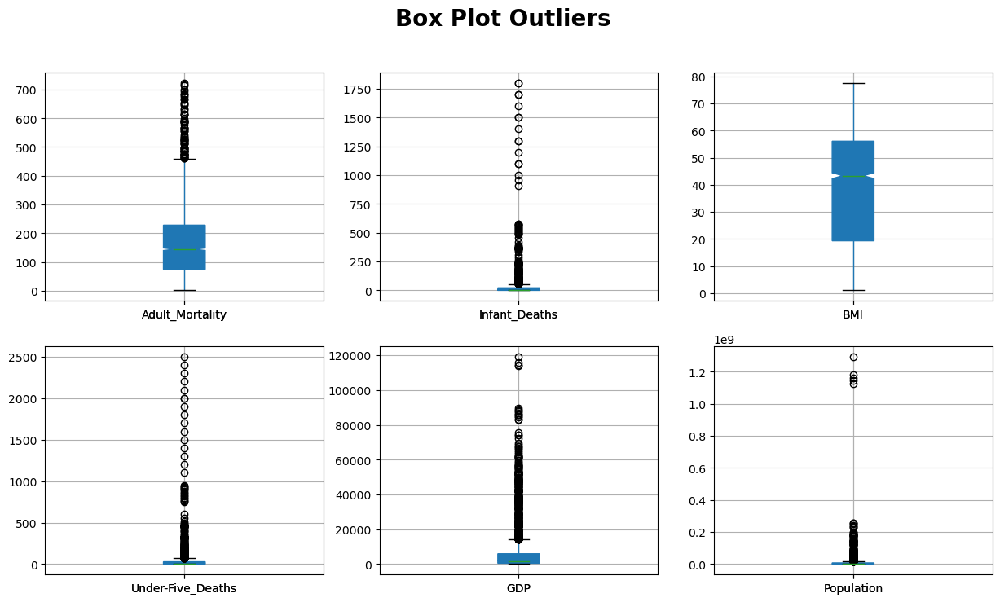

In [7]:
# Box plots for the potential outliers
%matplotlib inline
outlier_features = ['Adult_Mortality', 'Infant_Deaths', 'BMI', 'Under-Five_Deaths', 'GDP', 'Population']
plt.figure(figsize=(15, 8))

for i, col in enumerate(outlier_features, start=1):
    plt.subplot(2, 3, i)
    plt.xticks([1, 2, 3, 4, 5, 6], outlier_features)
    df.boxplot(col, notch=True, patch_artist=True)

pyplot.suptitle('Box Plot Outliers', fontsize=20, verticalalignment='top', horizontalalignment='center',
                fontweight='bold')
plt.savefig('charts/BoxPlot_Outliers.png', dpi=None, facecolor='w', edgecolor='g', orientation='landscape',
            format=None, transparent=False, bbox_inches=None, pad_inches=0.10, metadata=None)
plt.show()

## Null Summary

In [8]:

#def null_summary():
na_values = df.isna().sum().reset_index()  # Find NA values
na_values.columns = ["Features", "Missing_Values"]
na_values["Missing_Percent"] = round(na_values.Missing_Values / len(df) * 100, 2)
print("Summarize NULLS: \n", na_values[na_values.Missing_Values > 0])

df_nulls = na_values[na_values.Missing_Values > 0]
dfi.export(pd.DataFrame(df_nulls).style.background_gradient(), 'charts/Summarize_Nulls.png')  # Print to image
df.info()    

Summarize NULLS: 
                     Features  Missing_Values  Missing_Percent
6                    Alcohol             193             6.59
8                Hepatitis_B             553            18.89
10                       BMI              32             1.09
12                     Polio              19             0.65
13                Ttl_Expend             226             7.72
14                Diphtheria              19             0.65
16                       GDP             443            15.13
17                Population             644            21.99
18      Thinness_10-19_Years              32             1.09
19        Thinness_5-9_Years              32             1.09
20  Income_Comp_Of_Resources             160             5.46
21                 Schooling             160             5.46
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2928 entries, 0 to 2927
Data columns (total 22 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------  

It appears from the plots that there are some outliers with Adult Mortality and BMI which we can deal with later, but there also seem to be errors resulting in nulls with infant deaths and Under Five Deaths. 

## Inexplicit Nulls
Let’s deal with the outliers in BMI and Adult Mortality later with explicit nulls and address the nulls with Infant Deaths and Under Five Deaths.  

In [9]:
# Adjusting implicit NANs
global df
mort_5_percentile = np.percentile(df.Adult_Mortality.dropna(), 5)
#df.adult_mortality = df.apply(lambda x: np.nan if x.Adult_Mortality < mort_5_percentile else x.Adult_Mortality,
#                              axis=1)
df.Infant_Deaths = df.Infant_Deaths.replace(0, np.nan)
df['Under-Five_Deaths'] = df['Under-Five_Deaths'].replace(0, np.nan)  # Update global dataframe var
df.BMI = df.apply(lambda x: np.nan if (x.BMI < 10 or x.BMI > 50) else x.BMI, axis=1)
print("df.info():", df.info())  # Look at nulls that are left

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2928 entries, 0 to 2927
Data columns (total 22 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Country                   2928 non-null   object 
 1   Year                      2928 non-null   int64  
 2   Status                    2928 non-null   object 
 3   Life_Expectancy           2928 non-null   float64
 4   Adult_Mortality           2928 non-null   int64  
 5   Infant_Deaths             2090 non-null   float64
 6   Alcohol                   2735 non-null   float64
 7   Pct_Expenditure           2928 non-null   float64
 8   Hepatitis_B               2375 non-null   float64
 9   Measles                   2928 non-null   int64  
 10  BMI                       1482 non-null   float64
 11  Under-Five_Deaths         2153 non-null   float64
 12  Polio                     2909 non-null   float64
 13  Ttl_Expend                2702 non-null   float64
 14  Diphther

## Null Summary
Info() below will help take a look at the results.  At this point, the remaining missing values in the data should be attributable to explicit nulls.

In [10]:
#null_summary()  # Check for and summarize missing values
# Check for and summarize missing values
# Does basically the same as "null_details(df=df):", but prints to image
na_values = df.isna().sum().reset_index()  # Find NA values
na_values.columns = ["Features", "Missing_Values"]
na_values["Missing_Percent"] = round(na_values.Missing_Values / len(df) * 100, 2)
print("Summarize NULLS: \n", na_values[na_values.Missing_Values > 0])

df_nulls = na_values[na_values.Missing_Values > 0]
dfi.export(pd.DataFrame(df_nulls).style.background_gradient(), 'charts/Summarize_Nulls.png')  # Print to image
df.info()

Summarize NULLS: 
                     Features  Missing_Values  Missing_Percent
5              Infant_Deaths             838            28.62
6                    Alcohol             193             6.59
8                Hepatitis_B             553            18.89
10                       BMI            1446            49.39
11         Under-Five_Deaths             775            26.47
12                     Polio              19             0.65
13                Ttl_Expend             226             7.72
14                Diphtheria              19             0.65
16                       GDP             443            15.13
17                Population             644            21.99
18      Thinness_10-19_Years              32             1.09
19        Thinness_5-9_Years              32             1.09
20  Income_Comp_Of_Resources             160             5.46
21                 Schooling             160             5.46
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2

## Explicit Nulls
The data still has a significant amount null values so it will be necessary to look at the features in more detail to better understand where they are and their significance.  So, let’s detail the nulls. 

In [11]:
#null_explicit_details()  # Detail the explicit nulls
# Detail the explicit nulls
#null_explicit_details()  # View null breakdown again
global df
df_cols = list(df.columns)
cols_total_count = len(list(df.columns))
cols_count = 0
print("\n")
for loc, col in enumerate(df_cols):  # Iterate through the columns to find nulls
    null_count = df[col].isnull().sum()
    total_count = df[col].isnull().count()
    percent_null = round(null_count / total_count * 100, 2)
    if null_count > 0:
        cols_count += 1
        print('[iloc = {}] {} has {} null values: {}% null'.format(loc, col, null_count, percent_null))
cols_percent_null = round(cols_count / cols_total_count * 100, 2)
print('{} out of {} columns contain null values; {}% columns contain null values.'.format(cols_count,
                                                                                          cols_total_count,
                                                                                          cols_percent_null))



[iloc = 5] Infant_Deaths has 838 null values: 28.62% null
[iloc = 6] Alcohol has 193 null values: 6.59% null
[iloc = 8] Hepatitis_B has 553 null values: 18.89% null
[iloc = 10] BMI has 1446 null values: 49.39% null
[iloc = 11] Under-Five_Deaths has 775 null values: 26.47% null
[iloc = 12] Polio has 19 null values: 0.65% null
[iloc = 13] Ttl_Expend has 226 null values: 7.72% null
[iloc = 14] Diphtheria has 19 null values: 0.65% null
[iloc = 16] GDP has 443 null values: 15.13% null
[iloc = 17] Population has 644 null values: 21.99% null
[iloc = 18] Thinness_10-19_Years has 32 null values: 1.09% null
[iloc = 19] Thinness_5-9_Years has 32 null values: 1.09% null
[iloc = 20] Income_Comp_Of_Resources has 160 null values: 5.46% null
[iloc = 21] Schooling has 160 null values: 5.46% null
14 out of 22 columns contain null values; 63.64% columns contain null values.


From the details above we can see that there are still 14 columns that contain nulls, that’s 63.64%!  The details show us that we still have big contributing factors towards the remaining null values in the features BMI, Population, GDP, and Infant Deaths.  We’ll deal with those as explicit nulls.

#### DEALING WITH THE EXPLICIT NULLS
Because I am specifically dealing with life expectancy, there is no need to include data for any country that is missing the life expectancy values.  Those countries will be removed.
Countries with no life expectancy data:
•	Cook Islands, Dominica, Marshall Islands, Monaco, Nauru, Niue, Palau, Saint Kitts and Nevis, San Marino, Tuvalu

It also looks like the BMI feature has half null values, so I do not see the value in keeping this feature.  It will be removed.

In [12]:
#def remove_nulls():    
global df, feature_vars
df.Life_Expectancy.notnull()  # Removes countries with no life expectancy data
df.drop(columns='BMI', inplace=True)  # Most values are null for BMI so it's removed
feature_vars = list(df.columns)[3:]  # Update global features list var    

Because this data is a times series which can be regarded as a sequence of values, imputation can be used to estimate new values for the missing values some of these features contain, specifically the big null value offenders.  

In [13]:
#def imputed_data():
global df
df_cols = list(df.columns)
cols_total_count = len(list(df.columns))
cols_count = 0
print("\n")
for loc, col in enumerate(df_cols):  # Iterate through the columns to find nulls
    null_count = df[col].isnull().sum()
    total_count = df[col].isnull().count()
    percent_null = round(null_count / total_count * 100, 2)
    if null_count > 0:
        cols_count += 1
        print('[iloc = {}] {} has {} null values: {}% null'.format(loc, col, null_count, percent_null))
cols_percent_null = round(cols_count / cols_total_count * 100, 2)
print('{} out of {} columns contain null values; {}% columns contain null values.'.format(cols_count,
                                                                                          cols_total_count,
                                                                                          cols_percent_null))



[iloc = 5] Infant_Deaths has 838 null values: 28.62% null
[iloc = 6] Alcohol has 193 null values: 6.59% null
[iloc = 8] Hepatitis_B has 553 null values: 18.89% null
[iloc = 10] Under-Five_Deaths has 775 null values: 26.47% null
[iloc = 11] Polio has 19 null values: 0.65% null
[iloc = 12] Ttl_Expend has 226 null values: 7.72% null
[iloc = 13] Diphtheria has 19 null values: 0.65% null
[iloc = 15] GDP has 443 null values: 15.13% null
[iloc = 16] Population has 644 null values: 21.99% null
[iloc = 17] Thinness_10-19_Years has 32 null values: 1.09% null
[iloc = 18] Thinness_5-9_Years has 32 null values: 1.09% null
[iloc = 19] Income_Comp_Of_Resources has 160 null values: 5.46% null
[iloc = 20] Schooling has 160 null values: 5.46% null
13 out of 21 columns contain null values; 61.9% columns contain null values.


If we take another look at the null details, we see that we are null free.  Join me in a sigh of relief.  Kind of feels like cleaning out a closet, doesn’t it?!

In [14]:
#def null_explicit_details():
global df
df_cols = list(df.columns)
cols_total_count = len(list(df.columns))
cols_count = 0
print("\n")
for loc, col in enumerate(df_cols):  # Iterate through the columns to find nulls
    null_count = df[col].isnull().sum()
    total_count = df[col].isnull().count()
    percent_null = round(null_count / total_count * 100, 2)
    if null_count > 0:
        cols_count += 1
        print('[iloc = {}] {} has {} null values: {}% null'.format(loc, col, null_count, percent_null))
cols_percent_null = round(cols_count / cols_total_count * 100, 2)
print('{} out of {} columns contain null values; {}% columns contain null values.'.format(cols_count,
                                                                                          cols_total_count,
                                                                                          cols_percent_null))



[iloc = 5] Infant_Deaths has 838 null values: 28.62% null
[iloc = 6] Alcohol has 193 null values: 6.59% null
[iloc = 8] Hepatitis_B has 553 null values: 18.89% null
[iloc = 10] Under-Five_Deaths has 775 null values: 26.47% null
[iloc = 11] Polio has 19 null values: 0.65% null
[iloc = 12] Ttl_Expend has 226 null values: 7.72% null
[iloc = 13] Diphtheria has 19 null values: 0.65% null
[iloc = 15] GDP has 443 null values: 15.13% null
[iloc = 16] Population has 644 null values: 21.99% null
[iloc = 17] Thinness_10-19_Years has 32 null values: 1.09% null
[iloc = 18] Thinness_5-9_Years has 32 null values: 1.09% null
[iloc = 19] Income_Comp_Of_Resources has 160 null values: 5.46% null
[iloc = 20] Schooling has 160 null values: 5.46% null
13 out of 21 columns contain null values; 61.9% columns contain null values.


We’ve cleaned up the column heads, missing values, dealt with implicit and explicit nulls - outliers are next.

### OUTLIERS
In this section I will look into outliers by detecting them, visualizing them, and Winsorizing them.  Wins-a-what?  Winsoring the data will help minimize the influence of the outliers in the data and we know from the boxplots that at very least the adult mortality and BMI features have outliers. 
Let’s go outlier hunting for outliers! 

#### OUTLIER DETECTION
I think the best first step here is to expand on the original box plots done for BMI and Adult Mortality by plotting histograms and boxplots for each feature.  

The box plots below are one big image making it a bit lengthy, but I think its value makes it worth it the look.  

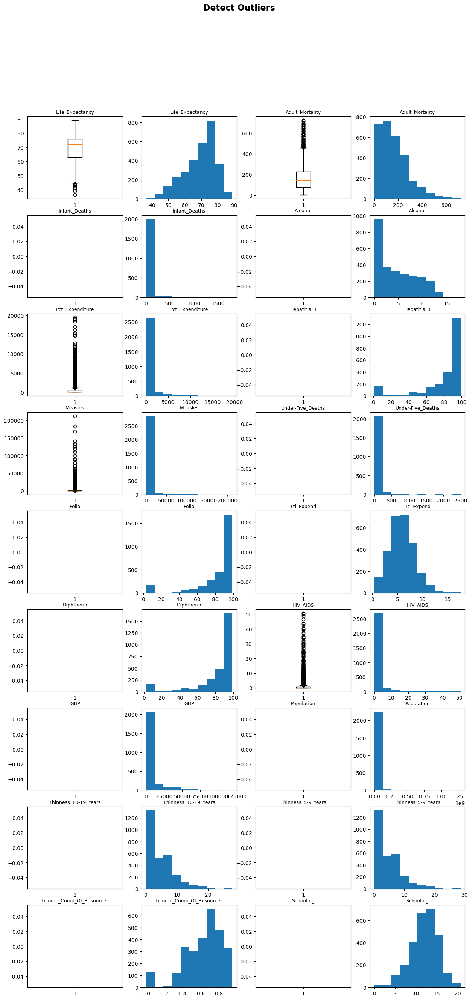

In [15]:
# Detect outliers with boxplots and histograms
plt.figure(figsize=(15, 30))
i = 0
for col in feature_vars:
    i += 1
    plt.subplot(9, 4, i)
    plt.boxplot(df[col])
    plt.title('{}'.format(col), fontsize=9)
    i += 1
    plt.subplot(9, 4, i)
    plt.hist(df[col])
    plt.title('{}'.format(col), fontsize=9)
pyplot.suptitle('Detect Outliers', fontsize=16, verticalalignment='top', horizontalalignment='center',
                fontweight='bold')
plt.savefig('charts/Detect_Outlier_Plots.png', dpi=None, facecolor='w', edgecolor='g', orientation='portrait',
            format=None, transparent=False, bbox_inches=None, pad_inches=0.0, metadata=None)
plt.show()




That’s a lot to unpack!  We can see that outliers are not uncommon and that’s a problem.  The biggest concern to me is that life expectancy has an outlier issue, especially given that this is our target feature.

But let’s stay focused.  

I would like to know the outlier details by feature so I will start there and apply Tukey’s rule which is a statistical method for identify what constitutes an outlier. 

In [16]:

#outlier_summary()  # Count outliers and plot
with open('charts/Outlier_Summary.txt', mode='w', newline='') as outlier_file:
    outlier_writer = csv.writer(outlier_file, delimiter=',', quotechar='"', quoting=csv.QUOTE_MINIMAL)
    for col in feature_vars:
        q75, q25 = np.percentile(df[col], [75, 25])
        iqr = q75 - q25
        min_val = q25 - (iqr * 1.5)
        max_val = q75 + (iqr * 1.5)
        count = len(np.where((df[col] > max_val) | (df[col] < min_val))[0])
        percent = round(count / len(df[col]) * 100, 2)

        total_chars = 45
        len_first_chars = 7
        len_col = len(col)
        chars_needed = total_chars - len_col - len_first_chars

        print(len_first_chars * '-' + col + ' Outliers' + chars_needed * '-')
        print('Count: {}'.format(count))
        print('Percentage of Data: {}%'.format(percent))

        outlier_writer.writerow([len_first_chars * '-' + col + ' Outliers' + chars_needed * '-'])
        outlier_writer.writerow(['Count: {}'.format(count)])
        outlier_writer.writerow(['Percentage of Data: {}%'.format(percent)])
        outlier_writer.writerow(' ')

-------Life_Expectancy Outliers-----------------------
Count: 10
Percentage of Data: 0.34%
-------Adult_Mortality Outliers-----------------------
Count: 82
Percentage of Data: 2.8%
-------Infant_Deaths Outliers-------------------------
Count: 0
Percentage of Data: 0.0%
-------Alcohol Outliers-------------------------------
Count: 0
Percentage of Data: 0.0%
-------Pct_Expenditure Outliers-----------------------
Count: 388
Percentage of Data: 13.25%
-------Hepatitis_B Outliers---------------------------
Count: 0
Percentage of Data: 0.0%
-------Measles Outliers-------------------------------
Count: 542
Percentage of Data: 18.51%
-------Under-Five_Deaths Outliers---------------------
Count: 0
Percentage of Data: 0.0%
-------Polio Outliers---------------------------------
Count: 0
Percentage of Data: 0.0%
-------Ttl_Expend Outliers----------------------------
Count: 0
Percentage of Data: 0.0%
-------Diphtheria Outliers----------------------------
Count: 0
Percentage of Data: 0.0%
-------HIV

The outlier summary shows a decent number of outliers that I will need to address.  

### WINSORIZATION
Let's work with the outliers.

Because there are a number of features with outlier issues and each one has its own unique issues, the method I will use to address outliners is to Winsorize the data.  This method will help to minimize that influence that outliers have on each variable.  Winsorizing the data will enable me to set upper and lower limits on each feature.  This limits the outlier’s severity and influence on the data.  

The parameters for winsorizing will be stored in a dictionary for easy access later in the project.


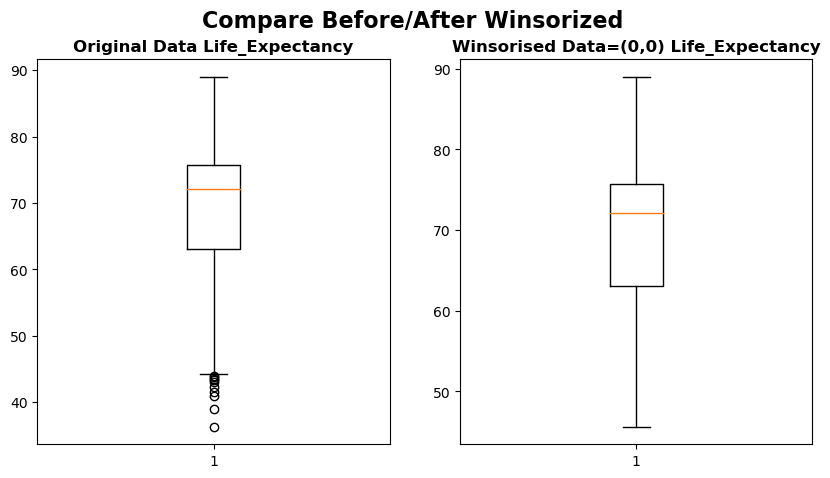

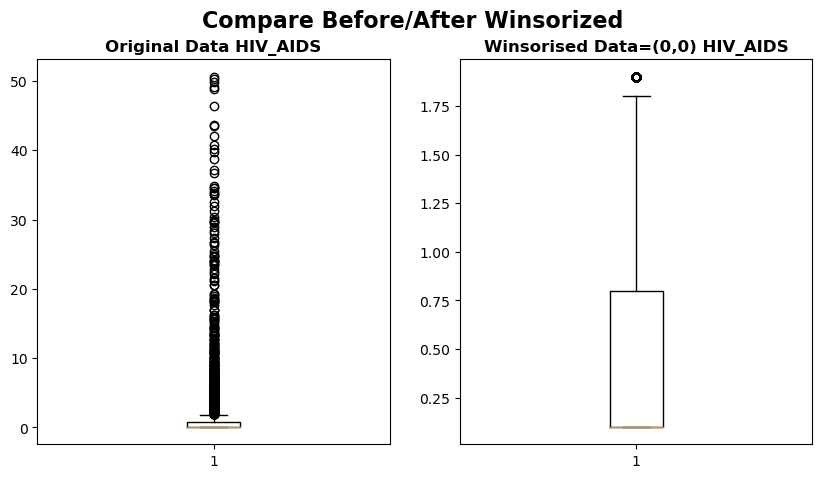

In [17]:
# Set windsorization vars with limits
def check_wins_plot(col, lower_limit=0, upper_limit=0, show_plot=True):
    global wins_dict
    wins_data = winsorize(df[col], limits=(lower_limit, upper_limit))  # Create winsorized col entries
    wins_dict[col] = wins_data  # Add the winsorized data to the wins dictionary

    if show_plot == True:
        plt.figure(figsize=(10, 5))
        plt.subplot(1, 2, 1)
        plt.boxplot(df[col])
        plt.title('Original Data {}'.format(col), fontweight='bold')
        plt.subplot(1, 2, 2)
        plt.boxplot(wins_data)
        pyplot.suptitle('Compare Before/After Winsorized\n', fontsize=16, verticalalignment='top',
                        horizontalalignment='center', fontweight='bold')
        plt.title('Winsorised Data=({},{}) {}'.format(0, 0, col), fontweight='bold')
        plt.savefig('charts/Compare_Winsorized' + col + '.png', dpi=None, facecolor='w', edgecolor='g',
                    orientation='landscape',
                    format=None, transparent=False, bbox_inches=None, pad_inches=0.10, metadata=None)
        plt.show()
        
check_wins_plot(feature_vars[0], lower_limit=.01, show_plot=True)
check_wins_plot(feature_vars[1], upper_limit=.04, show_plot=False)
check_wins_plot(feature_vars[2], upper_limit=.05, show_plot=False)
check_wins_plot(feature_vars[3], upper_limit=.0025, show_plot=False)
check_wins_plot(feature_vars[4], upper_limit=.135, show_plot=False)
check_wins_plot(feature_vars[5], lower_limit=.1, show_plot=False)
check_wins_plot(feature_vars[6], upper_limit=.19, show_plot=False)
check_wins_plot(feature_vars[7], upper_limit=.05, show_plot=False)
check_wins_plot(feature_vars[8], lower_limit=.1, show_plot=False)
check_wins_plot(feature_vars[9], upper_limit=.02, show_plot=False)
check_wins_plot(feature_vars[10], lower_limit=.105, show_plot=False)
check_wins_plot(feature_vars[11], upper_limit=.185, show_plot=True)
check_wins_plot(feature_vars[12], upper_limit=.105, show_plot=False)
check_wins_plot(feature_vars[13], upper_limit=.07, show_plot=False)
check_wins_plot(feature_vars[14], upper_limit=.035, show_plot=False)
check_wins_plot(feature_vars[15], upper_limit=.035, show_plot=False)
check_wins_plot(feature_vars[16], lower_limit=.05, show_plot=False)
check_wins_plot(feature_vars[17], lower_limit=.025, upper_limit=.005, show_plot=False)



The boxplots above are illustrations of successful winsorization for life expectancy and GDP.  These two are just shown as examples of the winsorization results for all numerical features.

## DATA EXPLORATION

Now that we are into the exploration phase, a new dataframe will be created from the winsorized data.

In [18]:
#create_wins_df()  # Create winsorized columns
global wins_df
wins_df = df.iloc[:, 0:3]  # Creating new winsorized dataframe
for col in list(df.columns)[3:]:
    wins_df[col] = wins_dict[col]  # Replace dict data with winsorized data

print("wins_df.describe(): \n", wins_df.describe())  # Show descriptive statistics
print("wins_df.describe(include='O'): \n", wins_df.describe(include='O'))  # Show count/frequency/max/quartiles

wins_df.describe(): 
              Year  Life_Expectancy  Adult_Mortality  Infant_Deaths      Alcohol  Pct_Expenditure  Hepatitis_B      Measles  Under-Five_Deaths        Polio   Ttl_Expend   Diphtheria     HIV_AIDS            GDP    Population  Thinness_10-19_Years  Thinness_5-9_Years  Income_Comp_Of_Resources    Schooling
count  2928.00000      2928.000000      2928.000000    2090.000000  2735.000000      2928.000000   2375.00000  2928.000000        2153.000000  2909.000000  2702.000000  2909.000000  2928.000000    2485.000000  2.284000e+03           2928.000000         2928.000000               2768.000000  2768.000000
mean   2007.50000        69.242008       161.050205      42.599522     4.614856       282.098414     85.06400   223.728825          57.362285    85.541079     5.930163    85.502578     0.546960    7494.210719  1.276454e+07              4.889652            4.926366                  0.641189    12.059971
std       4.61056         9.477572       113.321981     137.941420

### UNIVARIATE ANALYSIS
A univariate analysis is about looking into variables one at a time.  To do this I will first use describe() to show descriptive statistics, histograms for our continuous features and barplots for the categorical features. 

It appears as if the winsorization has had a big impact on many features, and not so much with other features.  Overall, the data looks much tighter for each feature. 

In [19]:
wins_df.describe()

,Year,Life_Expectancy,Adult_Mortality,Infant_Deaths,Alcohol,Pct_Expenditure,Hepatitis_B,Measles,Under-Five_Deaths,Polio,Ttl_Expend,Diphtheria,HIV_AIDS,GDP,Population,Thinness_10-19_Years,Thinness_5-9_Years,Income_Comp_Of_Resources,Schooling
count,2928.00000,2928.000000,2928.000000,2090.000000,2735.000000,2928.000000,2375.00000,2928.000000,2153.000000,2909.000000,2702.000000,2909.000000,2928.000000,2485.000000,2.284000e+03,2928.000000,2928.000000,2768.000000,2768.000000
mean,2007.50000,69.242008,161.050205,42.599522,4.614856,282.098414,85.06400,223.728825,57.362285,85.541079,5.930163,85.502578,0.546960,7494.210719,1.276454e+07,4.889652,4.926366,0.641189,12.059971
std,4.61056,9.477572,113.321981,137.941420,4.050749,384.583029,14.90956,333.733740,185.077201,15.313060,2.483273,15.256081,0.711661,14282.251492,6.103765e+07,4.243531,4.336407,0.176275,3.176977
min,2000.00000,45.600000,1.000000,1.000000,0.010000,0.000000,55.00000,0.000000,1.000000,52.000000,0.370000,52.000000,0.100000,1.681350,3.400000e+01,0.100000,0.100000,0.291000,4.900000
25%,2003.75000,63.100000,74.000000,2.000000,0.905000,4.853964,77.00000,0.000000,3.000000,78.000000,4.260000,78.000000,0.100000,463.852618,1.966738e+05,1.600000,1.600000,0.493000,10.100000
50%,2007.50000,72.100000,144.000000,9.000000,3.770000,65.611455,92.00000,17.000000,11.000000,93.000000,5.750000,93.000000,0.100000,1764.973870,1.391756e+06,3.400000,3.400000,0.677000,12.300000
75%,2011.25000,75.700000,228.000000,33.000000,7.715000,442.614322,97.00000,362.250000,46.000000,97.000000,7.490000,97.000000,0.800000,5932.899677,7.426746e+06,7.300000,7.300000,0.779250,14.300000
max,2015.00000,89.000000,428.000000,1800.000000,17.870000,1078.358105,99.00000,843.000000,2500.000000,99.000000,17.600000,99.000000,1.900000,119172.741800,1.293859e+09,16.900000,17.500000,0.948000,20.700000


### Visual Distributions
Next, histograms are used for our continuous features.

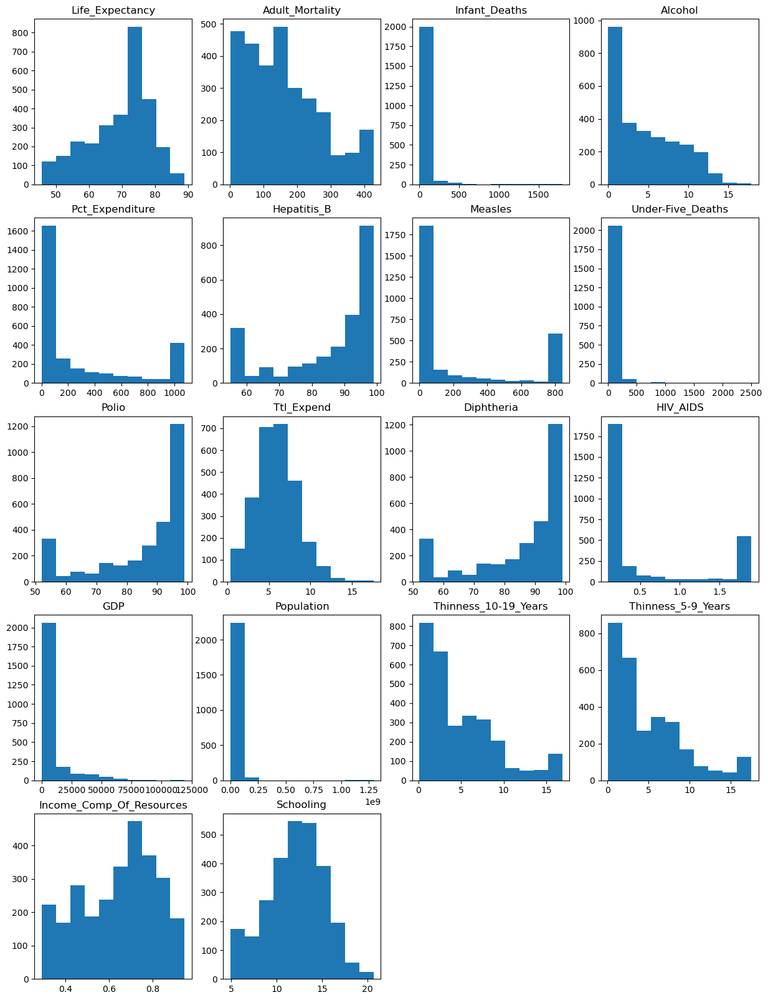

In [20]:
#def visualize_wins_dist():
plt.figure(figsize=(15, 20))
for i, col in enumerate(feature_vars, 1):
    plt.subplot(5, 4, i)
    plt.hist(wins_dict[col])
    plt.title(col)
    plt.xticks(fontsize=10)
    plt.yticks(fontsize=10)
plt.savefig('charts/Visualize_Winsorized.png', dpi=None, facecolor='w', edgecolor='g', orientation='portrait',
            format=None, transparent=False, bbox_inches=None, pad_inches=0.10, metadata=None)
plt.show()

It appears as if the winsorization has had a big impact on many features, and not so much with other features.  Overall, the data looks much tighter for each feature.  

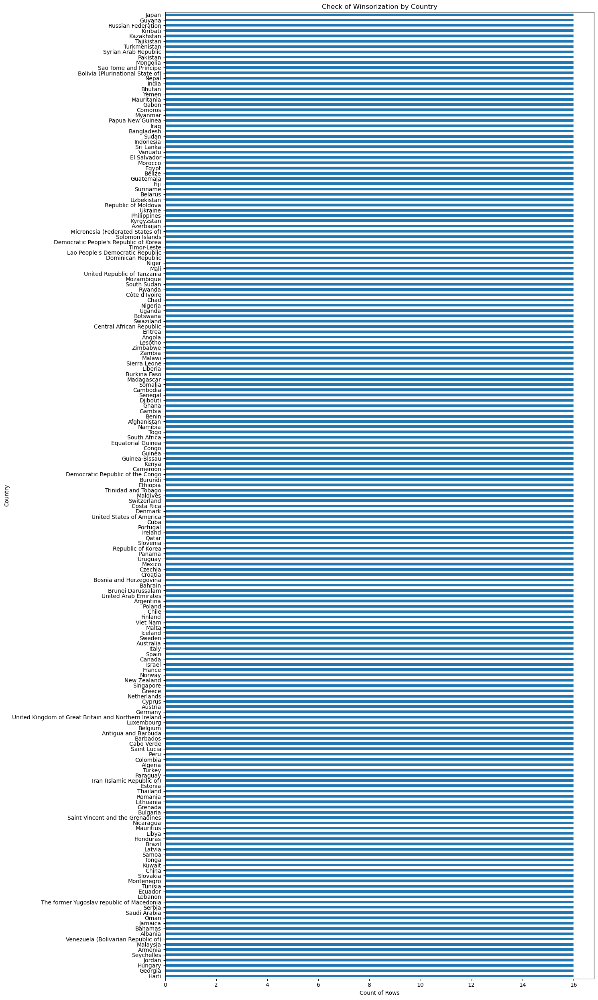

In [21]:
# Verify that winsorization was consistently applied
#def check_wins_country():
plt.figure(figsize=(15, 25))
wins_df.Country.value_counts(ascending=True).plot(kind='barh')
plt.title('Check of Winsorization by Country')
plt.xlabel('Count of Rows')
plt.ylabel('Country')
plt.tight_layout()
plt.savefig('charts/Check_Wins_by_Country.png', bbox_inches='tight')
plt.show()


The chart above is not visually stimulating; however, it shows that all of the remaining countries have 16 rows worth of data. Good to see that all the countries are being represented in the data!

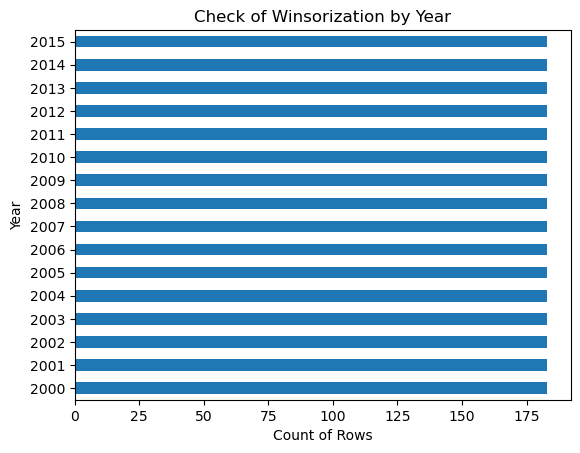

In [22]:
# Verify that winsorization was been applied correctly by Year
#def check_wins_year():
wins_df.Year.value_counts().sort_index().plot(kind='barh')
plt.title('Check of Winsorization by Year')
plt.xlabel('Count of Rows')
plt.ylabel('Year')
plt.savefig('charts/Check_Wins_by_Year.png', bbox_inches='tight')
plt.show()

This is another plot that doesn’t dazzle the eyes but show us that each year has the same number of rows of data. Another score!

Now let’s look at the volume of data from the standpoint of a developing or developed country status.  

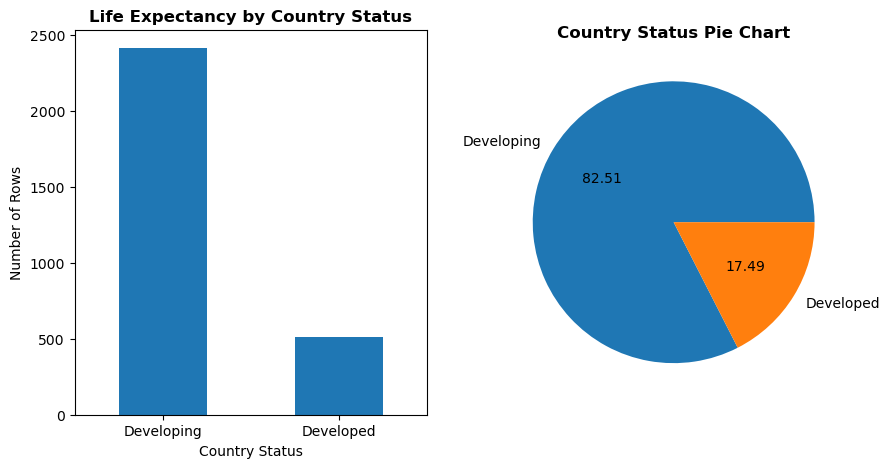

In [23]:
# Life Expectancy grouped by country and status
#def le_by_status():
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
wins_df.Status.value_counts().plot(kind='bar')
plt.title('Life Expectancy by Country Status', fontweight='bold')
plt.xlabel('Country Status')
plt.ylabel('Number of Rows')
plt.xticks(rotation=0)
plt.subplot(1, 2, 2)
wins_df.Status.value_counts().plot(kind='pie', autopct='%.2f')
plt.ylabel('')
plt.title('Country Status Pie Chart', fontweight='bold')
plt.savefig('charts/Life_Expectancy_by_Country_Status.png', bbox_inches='tight')
plt.show()

What’s significant about these next two charts is the amount of data that comes from the developing countries versus developed countries.  The pie chart shows that 82.51% of all the data comes from countries which have the developing Status!   

## Continuous Analysis
In this section I look at the continuous features compared to each other as well as their relationship to the life expectancy target feature. 
  
### Multi-Collinearity
The two heatmaps below are quite beneficial as they layout the correlations in a manner that is very easy to read.  Same data is used in both heatmaps, just a different way to illustrate the correlations.


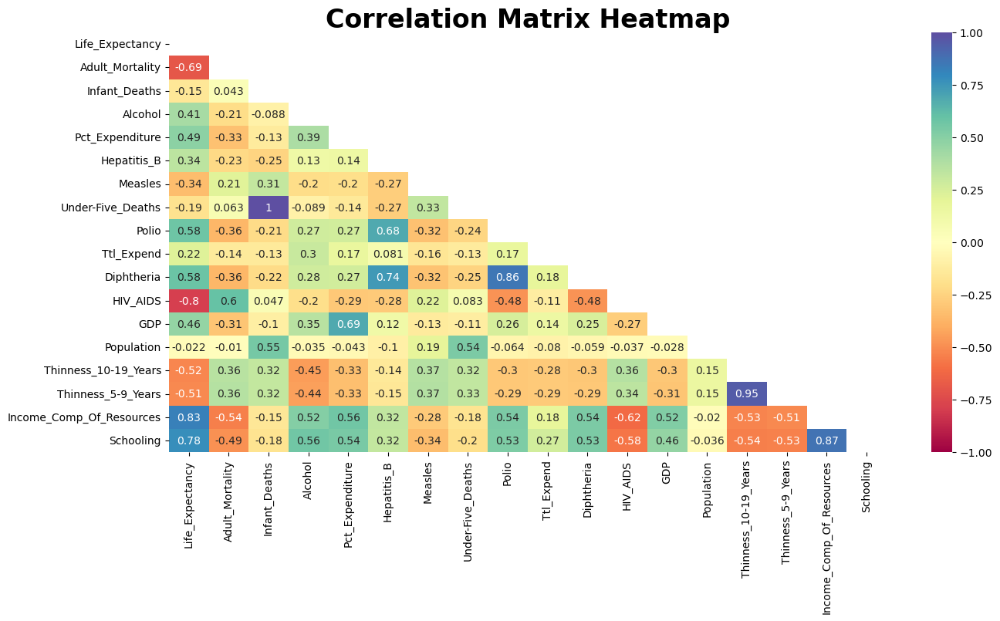

In [24]:
# Correlation matrix of winsorized feature's correlation
#corr_matrix_heatmap()  
mask = np.triu(wins_df[feature_vars].corr())  # Get upper triangle of array
plt.figure(figsize=(15, 8))
plt.subplots_adjust(bottom=.2)
sns.heatmap(wins_df[feature_vars].corr(), annot=True, fmt='.2g', vmin=-1, vmax=1, center=0,
            cmap='Spectral', mask=mask)
plt.ylim(18, 0)
plt.title('Correlation Matrix Heatmap', fontsize=24, verticalalignment='top', horizontalalignment='center',
          color='black', fontweight='bold')
plt.savefig('charts/Corr_Matrix_Heatmap.png', dpi=None, facecolor='w', edgecolor='g', orientation='landscape',
            format=None, transparent=False, bbox_inches=None, pad_inches=0.25, metadata=None)
plt.show()

#def create_data_corr():
df_styled = pd.DataFrame(wins_df.corr()).style.background_gradient()  # Style the text
dfi.export(df_styled, 'charts/Create_Data_Corr.png')  # Create image from text


A number of observations can be made including the somewhat high correlation between life expectancy, the target variable, and Adult Mortality, HIV/AIDS, income of composition resources, and schooling.  

Here are a few other observations:
<ul>
<li>Infant deaths and Under Five deaths are extremely highly correlated</li>
<li>GDP and Percentage Expenditure are fairly highly correlated</li>
<li>Diphtheria and Polio vaccine rate are highly positively correlated</li>
<li>Hepatitis B vaccine rate is positively correlated with Polio </li>
<li>Hepatitis B vaccine rate is positively correlated with and Diphtheria vaccine rates</li>
<li>Life Expectancy has almost no correlation to Population.</li>
<li>Schooling and Income Composition of Resources are highly correlated</li>
</ul>

For additional perspectives on correlation the chart below contains a matrix of scatter plots showing correlation among the numerical features.  

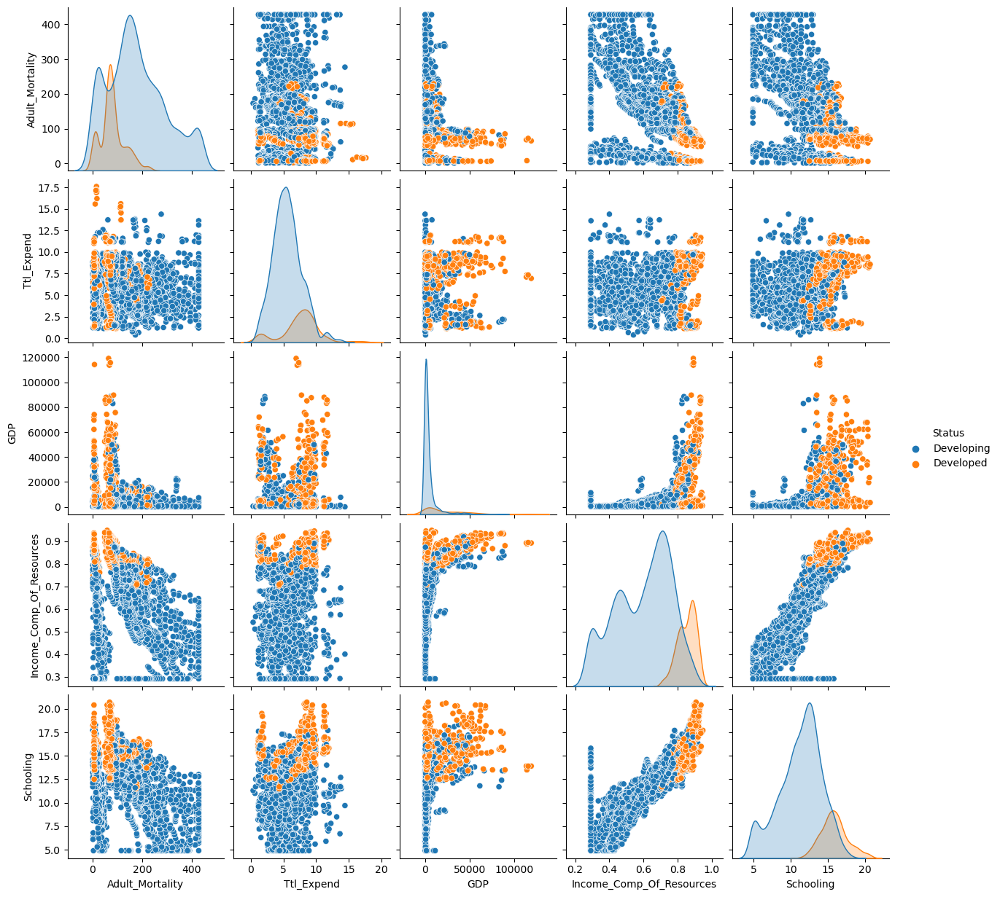

In [25]:
# Plot pairs for correlation testing
#def pairplot_corr():
sns.pairplot(wins_df,
             vars=['Adult_Mortality', 'Ttl_Expend', 'GDP', 'Income_Comp_Of_Resources', 'Schooling'],
             hue='Status')
plt.savefig('charts/Pairplot_Correlation.png', dpi=None, facecolor='w', edgecolor='g',
            orientation='landscape', format=None, transparent=False, bbox_inches=None, pad_inches=0.10, metadata=None)
plt.show()

### CATEGORICAL DATA
How has life expectancy changed over the years?  Let’s look at a line plot showing a time series of life expectancy from 2000 to 2015.  

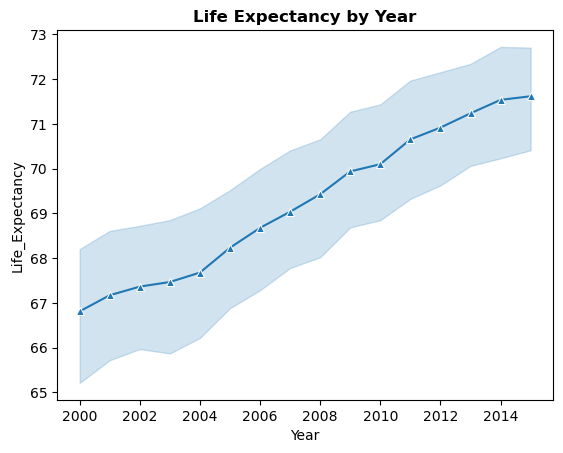

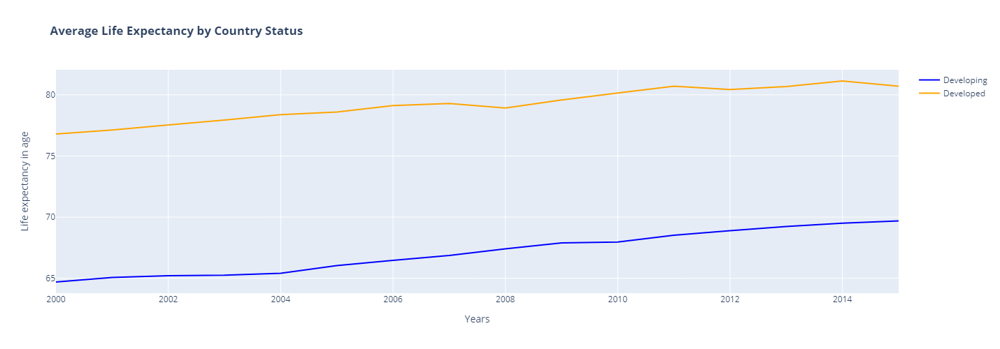

In [26]:
# Life Expectancy time series by Year
sns.lineplot(data=wins_df, x='Year', y='Life_Expectancy', marker='^')
plt.title('Life Expectancy by Year', fontweight='bold')
plt.savefig('charts/Line_Plot_Life_Expectancy_by_Year.png', bbox_inches='tight')
plt.show()

wins_df.Year.corr(wins_df.Life_Expectancy)  # Find the pairwise correlation

# Time series line plot of Life Expectancy by status
#def country_status_lineplot():
le_year = wins_df.groupby(by=['Year', 'Status']).mean().reset_index()
Developed = le_year.loc[le_year['Status'] == 'Developed', :]
Developing = le_year.loc[le_year['Status'] == 'Developing', :]
fig1 = go.Figure()
fig1.add_trace(go.Scatter(x=Developing['Year'], y=Developing['Life_Expectancy'],
                          mode='lines',
                          name='Developing',
                          marker_color='blue'))
fig1.add_trace(go.Scatter(x=Developed['Year'], y=Developed['Life_Expectancy'],
                          mode='lines',
                          name='Developed',
                          marker_color='orange'))
fig1.update_layout(
    height=500,
    xaxis_title="Years",
    yaxis_title='Life expectancy in age',
    title_text='<b>Average Life Expectancy by Country Status</b>')
fig1.show()

There’s definitely a positive trend with life expectancy over the 15 years of data provided.  The next chart below are reminder that the majority of our data comes from developing countries, yet the lowest life expectancy comes from the same developing countries.

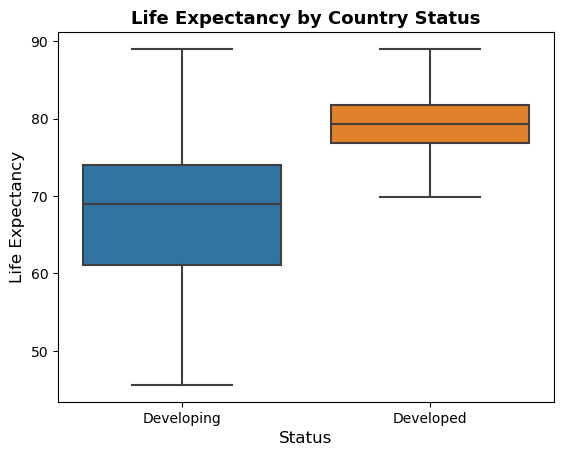

In [27]:
# Box plot by country status
#def boxplot_status():
sns.boxplot(x=wins_df['Status'], y=wins_df['Life_Expectancy'], fliersize=5)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)

plt.ylabel("Life Expectancy", fontsize=12)
plt.xlabel("Status", fontsize=12)
plt.title("Life Expectancy by Country Status", fontweight='bold', fontsize=13)
plt.savefig('charts/Boxplot_Status.png', dpi=None, facecolor='w', edgecolor='g', orientation='landscape',
            format=None, transparent=False, bbox_inches=None, pad_inches=0.10, metadata=None)
plt.show()

For additional information to think about I’ve done a density plot of life expectancy which shows that highest density in the lower to mid-70s.  


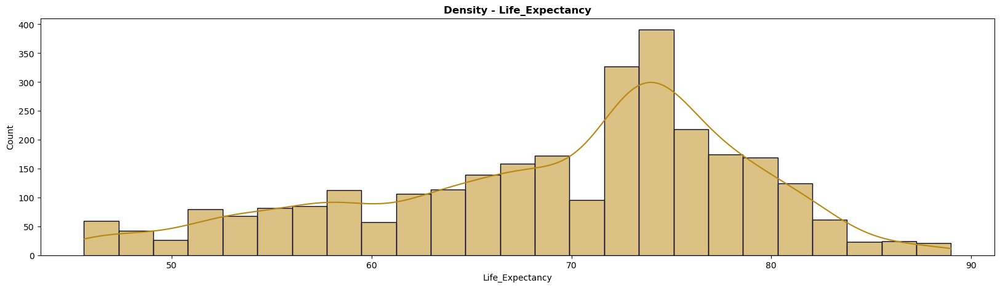

In [28]:
# Histogram of Life Expectancy density
#def le_desity_histplot():
plt.figure(figsize=(20, 5))
plt.title('Density - Life_Expectancy', fontweight='bold')
sns.histplot(wins_df['Life_Expectancy'].dropna(), kde=True, color="darkgoldenrod")
plt.savefig('charts/Density - Life_Expectancy.png', bbox_inches='tight')
plt.show()


We know where the correlation exist, how about any geographical correlation?

For additional information to think about I’ve done a density plot of life expectancy which shows that highest density in the lower to mid-70s.  

In [29]:
# Removing features with high correlation
#remove_features()  
global wins_df, feature_vars
rem_features = ['Thinness_5-9_Years', 'GDP', 'Infant_Deaths', 'Population']
for f in rem_features:
    wins_df.drop(f, axis=1)
feature_vars = list(wins_df.columns)[3:]

print("\n Remove Features Confirmation: \n", wins_df.info)



 Remove Features Confirmation: 
 <bound method DataFrame.info of            Country  Year      Status  Life_Expectancy  Adult_Mortality  Infant_Deaths  Alcohol  Pct_Expenditure  Hepatitis_B  Measles  ...  Polio  Ttl_Expend  Diphtheria  HIV_AIDS           GDP  Population  Thinness_10-19_Years  Thinness_5-9_Years  Income_Comp_Of_Resources  Schooling
0            Haiti  2010  Developing             45.6              428           23.0     5.76        36.292918          NaN        0  ...   66.0        8.90        66.0       1.9    662.279518   9999617.0                   4.0                 4.0                     0.470        8.6
1     Sierra Leone  2000  Developing             45.6              428           29.0     3.97        20.395683          NaN      843  ...   52.0       13.63        52.0       1.2    139.314773   4564297.0                   1.3                 1.4                     0.292        6.7
2     Sierra Leone  2001  Developing             45.6              428         

### Life Expectancy Ranking Summaries
We can also take a look at the “top” and “bottom” lists by mean and median to visually inspect the countries that stand out at the top and bottom.  As expected, based on the information above has indicated, the “bottom” lists are filled with African countries.  While This project does not do a deep dive into the features that represent root causes of lower or higher life expectancy, future projects might use this project as a spring board to do that deep dive.

In [30]:
def le_rankings(rank, stat_type, num_rows):
    order = False if rank == 'Top' else True

    # Generate text body for rankings
    if stat_type == 'Mean':
        text_body = pd.DataFrame(
            wins_df.groupby(['Country']).Life_Expectancy.mean().sort_values(ascending=order).head(num_rows))
    elif stat_type == 'Median':
        text_body = pd.DataFrame(
            wins_df.groupby(['Country']).Life_Expectancy.median().sort_values(ascending=order).head(num_rows))

    # Create images from text for all Top, Bottom, Mean, and Median combinations
    title = rank + ' ' + str(num_rows) + ' Life Expectancy (' + stat_type + ')'
    df_styled = text_body.style.background_gradient()  # Style the image
    dfi.export(df_styled, 'charts/' + rank + '_' + stat_type + '_' + 'Rankings.png')  # Create image from text
    print("\n" + str(title) + "\n" + str(text_body))
      
    
le_rankings('Top', 'Mean', 15)  # For Top Mean Countries
le_rankings('Top', 'Median', 15)  # For Top Median Countries
le_rankings('Bottom', 'Mean', 15)  # For Bottom Mean Countries
le_rankings('Bottom', 'Median', 15)  # For Bottom Median Countries



Top 15 Life Expectancy (Mean)
             Life_Expectancy
Country                     
Japan               82.53750
Sweden              82.51875
Iceland             82.44375
Switzerland         82.33125
France              82.21875
Italy               82.18750
Spain               82.06875
Australia           81.81250
Norway              81.79375
Canada              81.68750
Austria             81.48125
Singapore           81.47500
New Zealand         81.33750
Israel              81.30000
Greece              81.21875

Top 15 Life Expectancy (Median)
             Life_Expectancy
Country                     
Japan                  82.55
Switzerland            82.20
Iceland                81.95
Singapore              81.85
Sweden                 81.80
Australia              81.80
Spain                  81.75
Italy                  81.70
Israel                 81.60
France                 81.60
Canada                 81.35
Norway                 81.20
Netherlands            81.10
Austria 

To see if there is a statical difference between developed and developing I’ll run a t-test to test the hypothesis that there is a significant statistical difference.  

The results of the t-test shows a p-value of 1.478 indicating that there is a significant difference between developing and develop countries.

### More on Life Expectancy Features
I wanted to analyze two of the independent numerical two features to get an idea of their density and correlation to Life Expectancy and decided to do this with Schooling and Income of Resources.  IoR represents how productive resources are used in a country and Schooling represents number of years in school.  Both have shown to be correlated to Life Expectancy so let’s look a bit more at them.

The density plots represent all countries regardless of Status, but we’ll use that as the basis for our conclusions.    It would certainly be useful to break them down with respect to Status in my next project.  The scatter plots are crystal clear in illustrating the correlation between Schooling and Life Expectancy and Income of Resources and Life Expectancy.  WOW!  It almost seems like a miracle to live past 80 years old in a developing country.


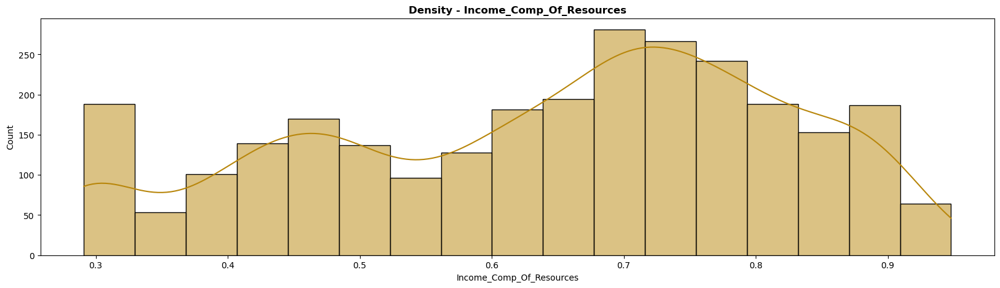

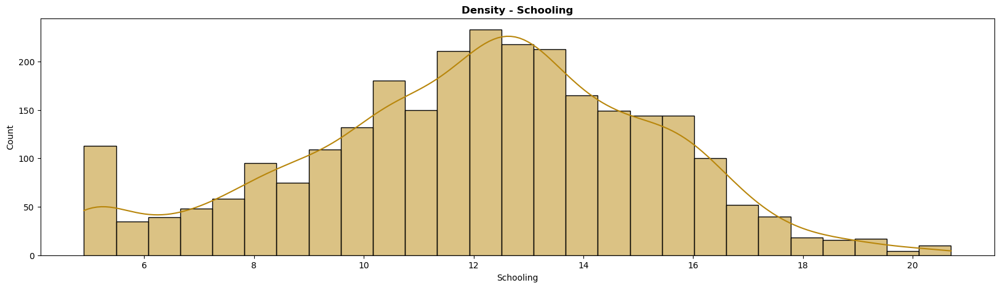

In [31]:
# Histogram of Life Expectancy density
#def le_desity_histplot():

plt.figure(figsize=(20, 5))
plt.title('Density - Income_Comp_Of_Resources', fontweight='bold')
sns.histplot(wins_df['Income_Comp_Of_Resources'].dropna(), kde=True, color="darkgoldenrod")
plt.savefig('charts/Density - Income_Comp_Of_Resources.png', bbox_inches='tight')
plt.show()

plt.figure(figsize=(20, 5))
plt.title('Density - Schooling', fontweight='bold')
sns.histplot(wins_df['Schooling'].dropna(), kde=True, color="darkgoldenrod")
plt.savefig('charts/Density - Schooling.png', bbox_inches='tight')
plt.show()

Next is the use of scatterplots to show correlation between develop/developing countries and other variables. The charts I found particularly intesting where the ones showing alchohol, hepatitis-b, and the measeles.

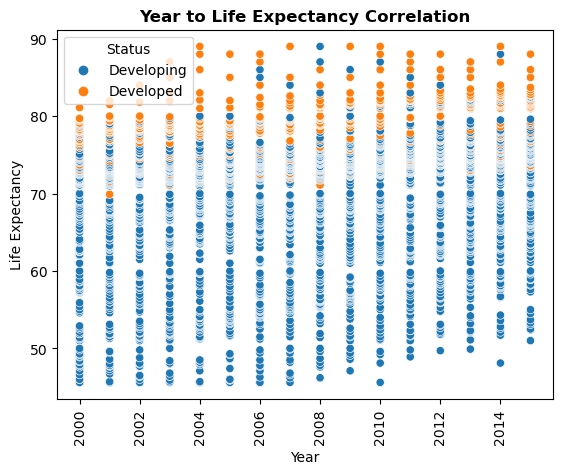

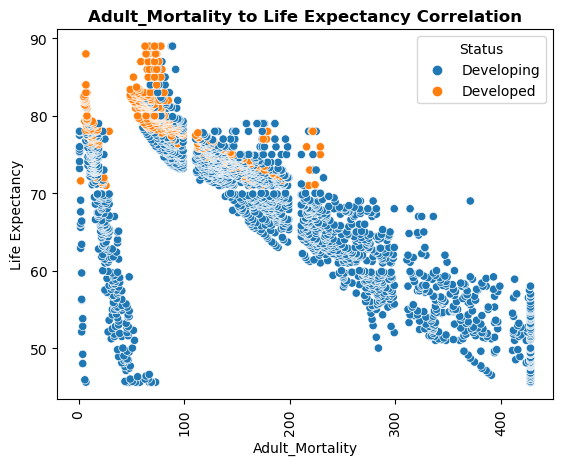

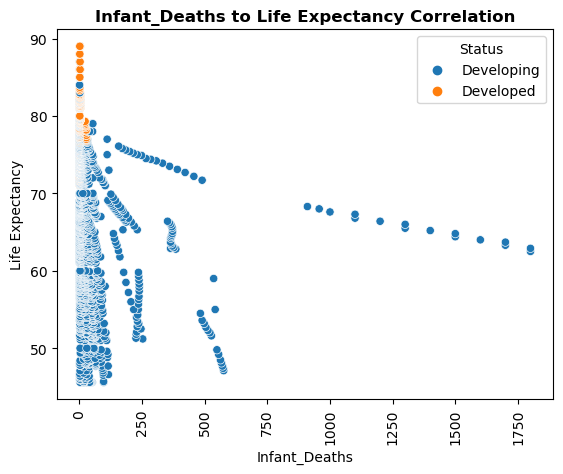

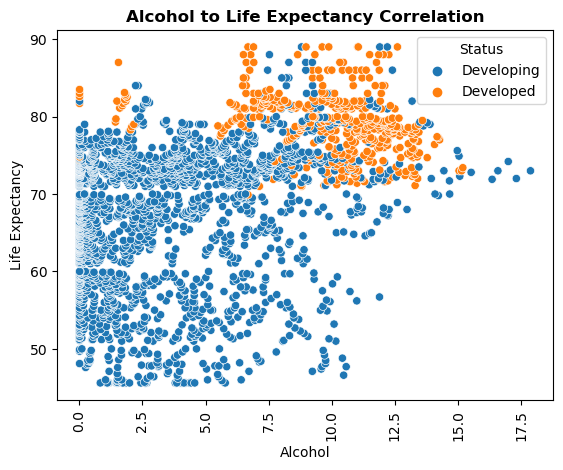

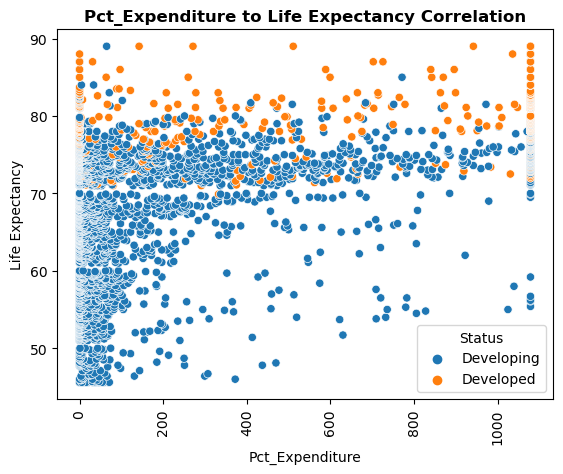

...

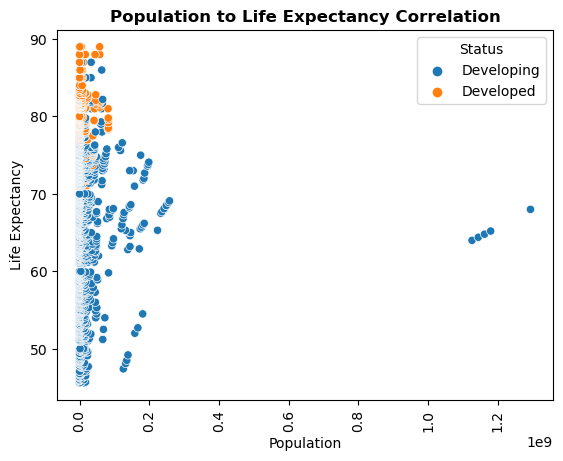

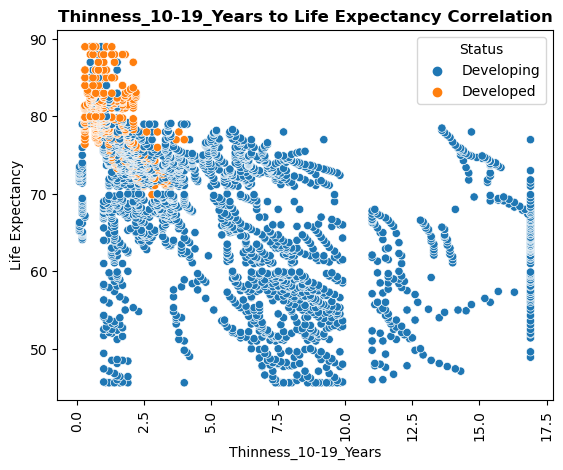

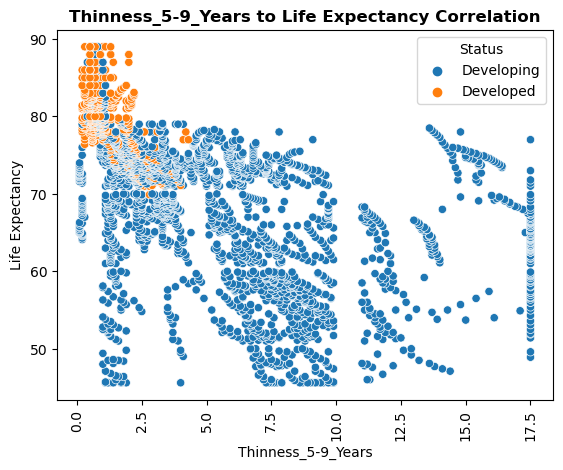

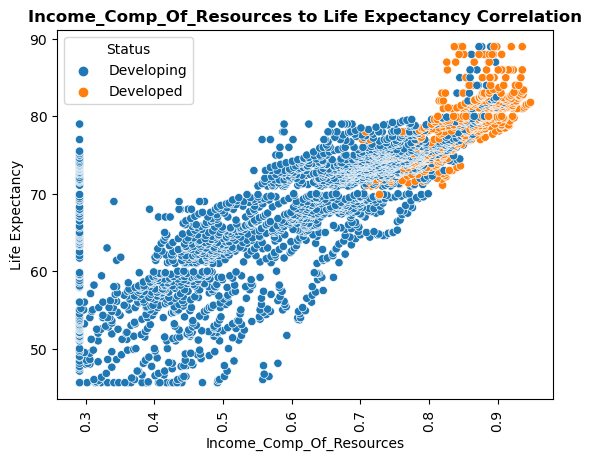

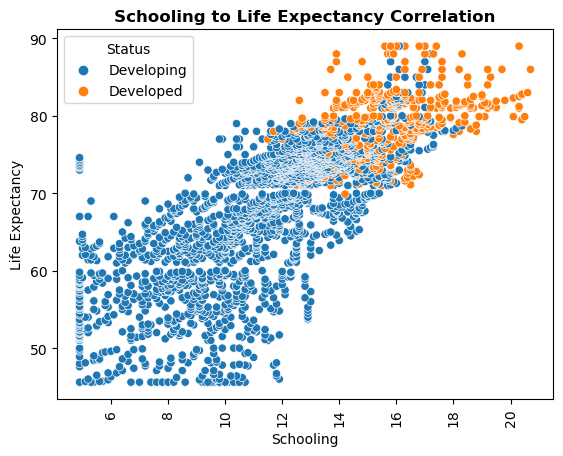

In [32]:
# Scatterplot showing feature correlation
#def scatterplot_features_corr():
wins_df_copy = wins_df.drop(['Life_Expectancy'], axis=1)
categorical_cols = wins_df_copy.select_dtypes(include="O")
numerical_cols = wins_df_copy.select_dtypes(exclude="O")

for col in numerical_cols.columns:
    sns.scatterplot(x=numerical_cols[col], y=wins_df["Life_Expectancy"], hue=categorical_cols.Status)
    plt.xticks(rotation=90, fontsize=10)
    plt.yticks(fontsize=10)
    plt.ylabel("Life Expectancy", fontsize=10)
    plt.xlabel(col, fontsize=10)
    plt.title(col + ' to Life Expectancy Correlation', fontweight='bold', fontsize=12)
    plt.savefig('charts/Scatterplot_' + col + '_corr.png', dpi=None, facecolor='w', edgecolor='g',
                orientation='landscape',
                format=None, transparent=False, bbox_inches=None, pad_inches=0.10, metadata=None)
    plt.show()

## TRAIN, TEST, and EVALUATE MODEL (MACHINE LEARNING)
So here we are, ready to model and predict!  In this section I will walk through linear regression, multiple regression, polynomial regression, decision tree, random forest, and logistical regression.  

### Linear Regression
For our modeling and predicting, let’s start off with linear regression to model the relationships between our independent and dependent variables.   I’ll do this with the GDP and Income Composition of Resources. 


regr.predict:  [[423.85583351]]
lr_coef:  [[0.0279748]]


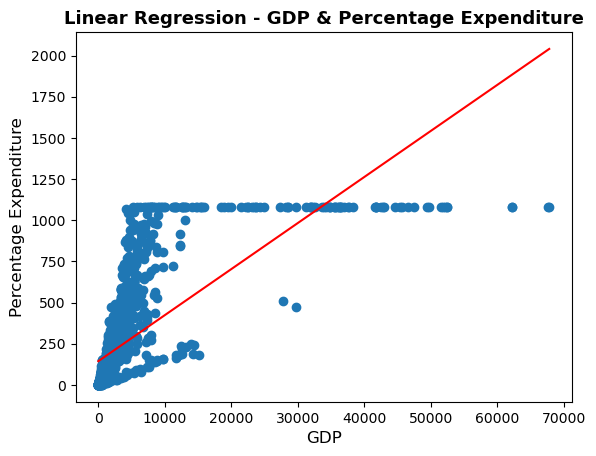

r2 Score:  0.526188254041543
Mean Absolute Error: 32804.6308
Mean Squared Error: 1437964545.7807
Root Mean Squared Error: 37920.5030


In [33]:
# Linear regression on GDP and Percentage Expenditure
#def linear_regression():
lr_df = wins_df.dropna().copy()  # Copy winsorized dataframe
regr = LinearRegression()
x = lr_df.GDP.values.reshape(-1, 1)
y = lr_df['Pct_Expenditure'].values.reshape(-1, 1)
regr.fit(x, y)  # Fit the linear model

lr_predict = regr.predict(([[10000]]))
print("regr.predict: ", lr_predict)
lr_coef = regr.coef_
print("lr_coef: ", lr_coef)

x_array = np.arange(min(lr_df.GDP), max(lr_df.GDP)).reshape(-1, 1)  # Create prediction line
plt.scatter(x, y)  # Plot the regression
y_head = regr.predict(x_array)  # Predict percentage of expenditure

plt.plot(x_array, y_head, color="red")
plt.ylabel("Percentage Expenditure", fontsize=12)
plt.xlabel("GDP", fontsize=12)
plt.title("Linear Regression - GDP & Percentage Expenditure", fontweight='bold', fontsize=13)
plt.savefig('charts/Linear_Regression.png', dpi=None, facecolor='w', edgecolor='g', orientation='landscape',
            format=None, transparent=False, bbox_inches=None, pad_inches=0.10, metadata=None)
plt.show()

print("r2 Score: ", r2_score(y, regr.predict(x)))
print("Mean Absolute Error: {:.4f}".format(metrics.mean_absolute_error(x_array, y_head)))
print("Mean Squared Error: {:.4f}".format(metrics.mean_squared_error(x_array, y_head)))
print("Root Mean Squared Error: {:.4f}".format(np.sqrt(metrics.mean_squared_error(x_array, y_head))))


The function above fits the linear regression model, calculates a few statistics, and plots the regression.  

### Multiple Linear Regression
With multiple linear regression I would like to look at Life Expectancy, the independent variable.  

Results from multiple linear regression prediction are below.  The correctness of the model is good.  It’s the difference between the training error and testing error.  

In [34]:
# Multiple linear regression of winsorized data
#def multiple_linear_regression():
mlr_df = wins_df.dropna().copy()  # Copy winsorized dataframe

mlr_df.drop(["Country", "Status"], axis=1, inplace=True)  # Drop because the are categorical
x = mlr_df.iloc[:, [-2, -1]].values  # The dependent variables/features
print("print X: ", x)
y = mlr_df['Pct_Expenditure'].values.reshape(-1, 1)  # The independent variable/features

x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.20, random_state=42)  # split data
regr = LinearRegression()
model = regr.fit(x_train, y_train)  # Fit the LR model

print("b0: ", regr.intercept_)
print("b1,b2: ", regr.coef_)

new_data = [[0.4, 8], [0.5, 10]]  # Random data to test
new_data = pd.DataFrame(new_data).T
model.predict(new_data)

# Mean squared error regression loss
mserl = np.sqrt(mean_squared_error(y_train, model.predict(x_train)))
print("Mean squared error regression loss: ", mserl)

# Train and predict model
model.score(x_train, y_train)  # Coefficient of determination
cross_val_score(model, x_train, y_train, cv=10, scoring="r2").mean()  # Evaluate the score by cross-validation
y_head = model.predict(x_test)
y_head[0:5]  # Get first 5

# Calculate r2 score
r2_degeri = r2_score(y_test, y_head)
print("\nTest r2 Error = ", r2_degeri)

print X:  [[ 0.388 10.4  ]
 [ 0.407  9.2  ]
 [ 0.437 10.7  ]
 ...
 [ 0.92  17.   ]
 [ 0.846 15.6  ]
 [ 0.849 16.   ]]
b0:  [-600.4350496]
b1,b2:  [[551.83483254  44.96194449]]
Mean squared error regression loss:  266.4589550270118

Test r2 Error =  0.39814687106226887


### Polynomial Regression
Polynomial regression can be beneficial in some cases where the data may have a a curvilinear relationship between the target variable and the independent variables.


r2 Value:  0.22218851598763079


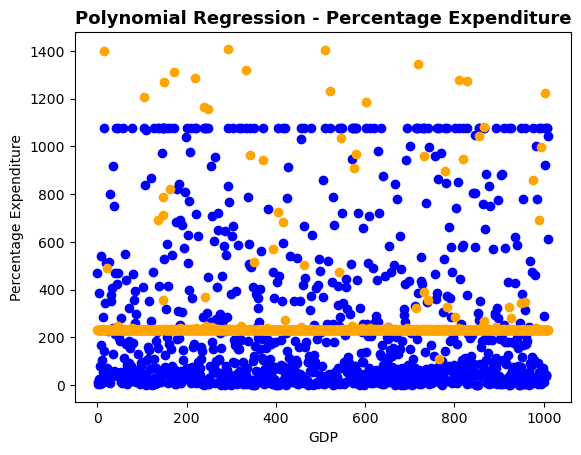

In [35]:
# Polynomial Regression of winsorized data
#def polynomial_regression():
poly_df = wins_df.dropna().copy()  # Copy winsorized dataframe
regr = LinearRegression()
x = poly_df.GDP.values.reshape(-1, 1)
y = poly_df['Pct_Expenditure'].values.reshape(-1, 1)
regr.fit(x, y)  # Fit linear model first

x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.20, random_state=42)  # Split data

poly_regr = PolynomialFeatures(degree=15)
x_polynomial = poly_regr.fit_transform(x)
regr.fit(x_polynomial, y)  # Fit the polynomial features model
y_head = regr.predict(x_polynomial)

poly_features = PolynomialFeatures(degree=8)
level_poly = poly_features.fit_transform(x_train)
regr.fit(level_poly, y_train)  # Fit the trained model
y_head = regr.predict(poly_features.fit_transform(x_train))
y_test = np.array(range(0, len(y_train)))

r2 = r2_score(y_train, y_head)
print("r2 Value: ", r2)  # percentage of significance

plt.scatter(y_test, y_train, color="blue")
plt.scatter(y_test, y_head, color="orange")
plt.xlabel("GDP")
plt.ylabel("Percentage Expenditure")
plt.title("Polynomial Regression - Percentage Expenditure", fontweight='bold', fontsize=13)
plt.savefig('charts/Polynomial_Regression.png', dpi=None, facecolor='w', edgecolor='g', orientation='landscape',
            format=None, transparent=False, bbox_inches=None, pad_inches=0.10, metadata=None)
plt.show()

The results from the polynomial regression prediction show a r2 value of 0.22218851598763079

### Decision Tree Regression
This function is a look at Percent Expenditure estimation of a Country with "GDP" value of 1000.

In [36]:
# Decision Tree Regression of winsorized data
#def decision_tree_regression():
dtr_df = wins_df.dropna().copy()  # Copy winsorized dataframe

x = dtr_df.GDP.values.reshape(-1, 1)
y = dtr_df['Pct_Expenditure'].values.reshape(-1, 1)
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.20, random_state=42)  # split data

regr = DecisionTreeRegressor()  # created model
regr.fit(x_train, y_train)  # fitted model according to train values

print("Decision Tree Prediction: ", regr.predict([[1000]]))

x_array = np.arange(min(x), max(x), 0.01).reshape(-1, 1)  # line information to be drawn as a predict
y_head = regr.predict(x_array)  # percentage of spend estimate

Decision Tree Prediction:  [19.15664091]


### Random Forrest Regression
Random forest regression uses decision tree logic and may be helpful in predicting average.

In [37]:
# Random Forest of winsorized data
#def random_forest_regression():
rfr_df = wins_df.dropna().copy()

x = rfr_df.GDP.values.reshape(-1, 1)
y = rfr_df['Pct_Expenditure'].values
regr = RandomForestRegressor(n_estimators=100, random_state=42)
regr.fit(x, y)  # The ideal fit line

print("Random Forest Prediction: ", regr.predict([[1000]]))
print("\n")

x_array = np.arange(min(x), max(x), 0.01).reshape(-1, 1)  # line information to be drawn as a predict
y_head = regr.predict(x_array)  # percentage of spend predict

Random Forest Prediction:  [70.88220472]




### Logistic Regression

In [38]:

# Logistic Regression of winsorized data
def logistic_regression():
    logi_df = wins_df.dropna().copy()  # Copy winsorized dataframe

    logi_df.drop(["Country"], axis=1, inplace=True)  # Drop categorical feature
    logi_df['Status'].value_counts()

    plt.title('Logistic Regression', fontweight='bold')
    plt.ylabel('Number of Rows')
    plt.xticks(rotation=0)
    plt.tight_layout()
    plt.title("Logistic Regression", fontweight='bold', fontsize=13)
    plt.savefig('charts/Logistic_Regression.png', dpi=None, facecolor='w', edgecolor='g', orientation='landscape',
                format=None, transparent=False, bbox_inches=None, pad_inches=0.10, metadata=None)
    logi_df.Status.value_counts().plot(kind='bar')
    logi_df.Status = [1 if each == "Developing" else 0 for each in logi_df.Status]  # Convert to nominal vals
    print("log_reg - logi_df.describe().T", logi_df.describe().T)

    # Normalize the data
    y = logi_df['Status']
    X_data = logi_df.drop(['Status'], axis=1)
    X = (X_data - np.min(X_data)) / (np.max(X_data) - np.min(X_data)).values
    
    # Implement model
    logi = sm.Logit(y, X_data)
    logi_model = logi.fit()
    print("Model Summary()", logi_model.summary())
    print("\n")
    
    # Create & plot summary
    fig_size = (10, 8)  # w x h
    plt.figure(figsize=fig_size)
    plt.axis('off')
    plt.title("Logistical Model Summary", fontsize=12, verticalalignment='baseline', horizontalalignment='center',
              color='white', backgroundcolor='orange')
    plt.text(0, 0, str(logi_model.summary()), fontsize=10, fontproperties='monospace', verticalalignment='bottom',
             horizontalalignment='left')
    plt.savefig("charts/Logistical_Model_Summary.png", dpi=None, facecolor='w', edgecolor='g', orientation='portrait',
                format=None, transparent=False, bbox_inches=None, pad_inches=0.05, metadata=None)

    logi = LogisticRegression(solver="liblinear")
    logi_model = logi.fit(X, y)  # The ideal fit line

    print("logi_model.intercept_ :", logi_model.intercept_)  # TODO what is this?
    print("logi_model.coef_ :", logi_model.coef_)  # TODO what is this?

    prediction_tune_model(logi_model, X, y)  # Call model tuning function

T-TEST
We can see that developed countries have a higher mean Life Expectancy.  We can use a t-test comparison to see if the difference is significant.


In [39]:
# Ttest to determine significance of difference between developed and developing
#def ttest():
ttest_results = stats.ttest_ind(wins_df.loc[wins_df['Status']=='Developed','Life_Expectancy'], wins_df.loc[wins_df['Status']=='Developing','Life_Expectancy'])

print("ttest_results: ", ttest_results)

ttest_results:  Ttest_indResult(statistic=29.891259171163895, pvalue=1.477890297267704e-171)


C:\Users\sschi\AppData\Local\Temp\ipykernel_28384\639115280.py:3: DeprecationWarning:

Please use `ttest_ind` from the `scipy.stats` namespace, the `scipy.stats.stats` namespace is deprecated.



The t-test results show that there is a significant difference between developing and developed countries when it comes to life expectancy.

### Prediction Accuracy

In [40]:
#def prediction_tune_model(logi_model, X, y):
y_pred = logi_model.predict(X)
confusion_matrix(y, y_pred)
accuracy_score(y, y_pred)

# logi_model.predict(X)[0:10] # TODO do anything?
# print("logi_model.predict_proba(X)", logi_model.predict_proba(X)[0:10][:, 0:2])  # Set Top 10 TODO do anything?

y_probs = logi_model.predict_proba(X)
y_probs = y_probs[:, 1]
# y_probs[0:10])  # Set top 10  TODO do anything?
y_pred = [1 if i > 0.5 else 0 for i in y_probs]
# y_pred[0:10])   TODO do anything?

print("\nConfusion Matrix:\n", confusion_matrix(y, y_pred))  # Evaluate the accuracy of classification
print("\nAccuracy Score: ", accuracy_score(y, y_pred))  # Accuracy score
print("\n Classification Report:\n", classification_report(y, y_pred))  # Show main classification metrics

logi_model.predict_proba(X)[:, 1][0:5] # TODO do anything?
logit_roc_auc = roc_auc_score(y, logi_model.predict(X))
fpr, tpr, thresholds = roc_curve(y, logi_model.predict_proba(X)[:, 1])

plt.figure()
plt.plot(fpr, tpr, label='AUC (area = %0.2f)' % logit_roc_auc)
plt.plot([0, 1], [0, 1], 'r--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.ylabel("True Positive Rate", fontsize=12)
plt.xlabel("False Positive Rate", fontsize=12)
plt.title("ROC Curve", fontweight='bold', fontsize=13)
plt.savefig('charts/ROC_Curve.png', dpi=None, facecolor='w', edgecolor='g', orientation='landscape',
            format=None, transparent=False, bbox_inches=None, pad_inches=0.10, metadata=None)
plt.show()


NameError: name 'logi_model' is not defined

The confusion matrix allows us to see the high number of True Negatives (169) and True Positives (1362), greatly outnumbering the False Positives (73) and False Negatives (45).

The model has proved to be 92.8% accurate.  I’d say that’s a success!   

An f1-score of .96 is also impressive as the closer it is to 1, the better the precision and recall for the data. 
We can also see that the cross value score (uses k-fold) tells us that with this data the model scored 93.3%!  What’s nice here is the consistency in prediction accuracy scoring.  


## SUMMARY
The dataset began with 21 variables that were processed down to 12 independent variables (features) that describe Life Expectancy, the dependent variable.  

The data was cleaned by first cleaning up the headings, then detecting and dealt with missing values, both inexplicit and explicit.  The data was also imputed and winsorized to address various missing values and outliers. From this a model was born. 

A number of machine learning methods were applied to the model including Linear Regression, Multiple Regression, Decision Tree regression, Random Forest Regression, and t-test.  

Accuracy metrics like Confusion Matrix, Accuracy Score, Classification Report, and Cross Value Score were run, and the model scored an excellent 93% accuracy.

While this project was more focused on predictions and the exploratory data process, future projects would benefit from what was learned here.  

Additional questions to be answered in future projects:
<ul>
    <li>What is the impact of disease in developed versus developing nations?</li>
<li>What are the impacts of vaccines on Life Expectancy in developing nations?</li>
<li>Which immunizations have the highest correlation to greater life expectancy?</li>
<li>What 5 features would be most impactful on life expectancy in developing countries?</li>
</ul>